# Previous Config

## Packages and folders

In [ ]:
!pip install -U ranx sentence-transformers datasets accelerate #xformers
!pip uninstall -y wandb

# =====================
# Standard library
# =====================
import argparse
import gc
import itertools
import json
import logging
import multiprocessing as mp
import os
import re
import shutil
import signal
import sys
import tempfile
import time
import traceback
import unicodedata
import zipfile
from multiprocessing import Process, Queue
from pathlib import Path
from typing import Any, Dict, List

import psutil


# =====================
# Third-party libraries
# =====================
import numpy as np
import pandas as pd
import torch
from datasets import Dataset
from google.colab import userdata
from huggingface_hub import (
    HfApi,
    list_models,
    login,
    model_info,
    snapshot_download,
    whoami,
)
from ranx import Qrels, Run, evaluate, fuse
from sentence_transformers import (
    CrossEncoder,
    InputExample,
    SentenceTransformer,
    SentenceTransformerTrainer,
    SentenceTransformerTrainingArguments,
    evaluation,
    losses,
    util,
)
from sentence_transformers.training_args import BatchSamplers
from transformers import EarlyStoppingCallback


  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.3/99.3 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 515.2/515.2 kB 19.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.6/47.6 MB 19.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 285.4/285.4 kB 11.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 38.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 866.1/866.1 kB 29.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 37.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 149.0/149.0 kB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.6/45.6 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.0/5.0 MB 55.5 MB/s eta 0:00:00
  Created wheel for warc3-wet-clueweb09: filename=warc3_wet_clueweb09-0.2.5-py3-none-any.whl size=18919 sha256=344b292b5dd21f2c27

In [ ]:
token = userdata.get('HF_TOKEN')
login(token=token)
print(whoami())

{'type': 'user', 'id': '663b5ba4347ccbda6657011c', 'name': 'davidpedidos', 'fullname': 'Garcia', 'isPro': False, 'avatarUrl': '/avatars/c7ec7e4f116a9a483fdbdb95dc009fc2.svg', 'orgs': [], 'auth': {'type': 'access_token', 'accessToken': {'displayName': 'colab_exe', 'role': 'fineGrained', 'createdAt': '2025-12-03T15:52:39.743Z', 'fineGrained': {'canReadGatedRepos': False, 'global': [], 'scoped': [{'entity': {'_id': '663b5ba4347ccbda6657011c', 'type': 'user', 'name': 'davidpedidos'}, 'permissions': []}]}}}}


In [ ]:
# Configuración básica
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)
today = time.strftime("%Y-%m-%d")

In [ ]:
def set_directories():
  project_dir = Path(__name__).resolve().parents[1]
  project_dir = project_dir / 'content' / 'TalentCLEF-TaskA'
  date_dir = project_dir.parent / 'output' / today
  date_dir.mkdir(parents=True, exist_ok=True)

  # Crear subdirectorio incremental por ejecución (001, 002, ...)
  exec_dirs = sorted([d for d in date_dir.iterdir() if d.is_dir() and d.name.isdigit() and len(d.name) == 3])
  if exec_dirs and not any(exec_dirs[-1].iterdir()):
      output_dir = exec_dirs[-1]
  else:
      next_id = int(exec_dirs[-1].name) + 1 if exec_dirs else 1
      output_dir = date_dir / f"{next_id:03d}"
      output_dir.mkdir(exist_ok=True)

  return project_dir, output_dir

project_dir, output_dir = set_directories()

In [ ]:
!git clone https://github.com/davidgc14/TalentCLEF-TaskA.git
!cp ./TalentCLEF-TaskA/src/output/ranking_spanish_validation.csv {output_dir.parent.parent}
!rm -r sample_data/

Cloning into 'TalentCLEF-TaskA'...
remote: Enumerating objects: 1199, done.
remote: Counting objects: 100% (985/985), done.
remote: Compressing objects: 100% (504/504), done.
remote: Total 1199 (delta 581), reused 860 (delta 462), pack-reused 214 (from 1)
Receiving objects: 100% (1199/1199), 68.50 MiB | 20.61 MiB/s, done.
Resolving deltas: 100% (648/648), done.


## Evaluation functions

In [ ]:
def load_qrels(qrels_path):
    """
    Loads the qrels file (TREC format: q_id, iter, doc_id, rel)
    and converts it to a Qrels object.
    """
    qrels_df = pd.read_csv(qrels_path, sep="\t", header=None,
                           names=["q_id", "iter", "doc_id", "rel"],
                           dtype={"q_id": str, "doc_id": str, "rel":int})

    return Qrels.from_df(qrels_df, q_id_col="q_id", doc_id_col="doc_id", score_col="rel")

def load_run(run_path):
    """
    Loads the run file (TREC format: q_id, Q0, doc_id, rank, score, [tag])
    and converts it to a Run object.
    """
    run_df = pd.read_csv(run_path, sep=r"\s+", header=None)

    # Assign column names based on the number of columns
    if run_df.shape[1] == 5:
        run_df.columns = ["q_id", "Q0", "doc_id", "rank", "score"]
    elif run_df.shape[1] >= 6:
        run_df.columns = ["q_id", "Q0", "doc_id", "rank", "score", "tag"]
    else:
        raise ValueError("The run file does not have the expected format.")

    run_df["q_id"] = run_df.q_id.astype(str)
    run_df["doc_id"] = run_df.doc_id.astype(str)
    return Run.from_df(run_df, q_id_col="q_id", doc_id_col="doc_id", score_col="score")

def evaluate_run(qrels_path, run_path):
    """Evalúa un run y devuelve los resultados como dict."""
    qrels = load_qrels(qrels_path)
    run = load_run(run_path)
    metrics = ["map", "mrr", "ndcg", "precision@5", "precision@10", "precision@100"]
    return evaluate(qrels, run, metrics)

In [ ]:

# ========================
# DATA LOADING AND ENCODING
# ========================

def load_spanish_data(data_dir):
    """Load queries and corpus elements from Spanish data directory."""
    queries_path = data_dir / "queries"
    corpus_elements_path = data_dir / "corpus_elements"

    queries = pd.read_csv(queries_path, sep="\t")
    corpus_elements = pd.read_csv(corpus_elements_path, sep="\t")

    return (
        queries.q_id.to_list(),
        queries.jobtitle.to_list(),
        corpus_elements.c_id.to_list(),
        corpus_elements.jobtitle.to_list(),
    )


def encode_data(model, queries_texts, corpus_texts, model_name, device):
    """Encode queries and corpus using the model."""
    print('Encoding data:', model_name, 'on device:', device)
    query_embeddings = model.encode(queries_texts, convert_to_tensor=True, show_progress_bar=False, device=device)
    corpus_embeddings = model.encode(corpus_texts, convert_to_tensor=True, show_progress_bar=False, device=device)
    # Convert to float32 to ensure compatibility with cosine similarity if fp16 is enabled
    return query_embeddings.to(torch.float32), corpus_embeddings.to(torch.float32)


def calculate_similarities_and_format_results(query_embeddings, corpus_embeddings, queries_ids, corpus_ids, model_name):
    """Calculate cosine similarities and format results in TREC format."""
    print('Calculating similarities and preparing results...')
    similarities = util.cos_sim(query_embeddings, corpus_embeddings).cpu().numpy()

    results = []
    for q_idx, q_id in enumerate(queries_ids):
        sorted_indices = np.argsort(-similarities[q_idx])  # Orden descendente
        for rank, c_idx in enumerate(sorted_indices):
            doc_id = corpus_ids[c_idx]
            score = similarities[q_idx, c_idx]
            results.append(f"{str(q_id)} Q0 {str(doc_id)} {rank+1} {score:.8f} {model_name}")
    return results


def calculate_full_results_for_ranx(query_embeddings, corpus_embeddings, queries_ids, corpus_ids):
    """
    Calcula similitudes y devuelve un diccionario con EL RANKING COMPLETO
    de todos los documentos para cada query, compatible con ranx.Run.
    """
    print('Calculando similitudes totales...')
    similarities = util.cos_sim(query_embeddings, corpus_embeddings).cpu().numpy()

    run_dict = {}

    for q_idx, q_id in enumerate(queries_ids):
        sorted_indices = np.argsort(-similarities[q_idx])

        run_dict[str(q_id)] = {
            str(corpus_ids[c_idx]): float(similarities[q_idx, c_idx])
            for c_idx in sorted_indices
        }

    return run_dict


def run_evaluation_temp(qrels_path, results, model_name):
    """Run evaluation using temporary file without saving."""
    print('Evaluating Spanish monolingual performance...')

    # Crear archivo temporal
    with tempfile.NamedTemporaryFile(mode='w', suffix='.trec', delete=False, encoding='utf-8') as tmp_file:
        tmp_file.write("\n".join(results))
        tmp_path = tmp_file.name

    try:
        evaluation_results = evaluate_run(qrels_path, tmp_path)
    finally:
        # Eliminar archivo temporal
        os.unlink(tmp_path)

    return evaluation_results


def get_model_name(model):
    """Extract model name from the model object."""
    model_name = model[0].auto_model.config._name_or_path
    return model_name.split("/")[-1]


def write_run_file(results, run_file):
    """Write results to TREC format file."""
    print('Writing results')
    with open(run_file, "w", encoding="utf-8") as f:
        f.write("\n".join(results))


# ========================
# EVALUATION FUNCTION
# ========================

def spanish_monolingual_evaluation(model, device, source):
    """Evaluate model performance on Spanish monolingual data."""
    data_dir = project_dir / 'data' / source / 'spanish'
    qrels_path = data_dir / "qrels.tsv"

    print('Loading Spanish data...')
    queries_ids, queries_texts, corpus_ids, corpus_texts = load_spanish_data(data_dir)
    model_name = get_model_name(model)

    query_embeddings, corpus_embeddings = encode_data(model, queries_texts, corpus_texts, model_name, device)
    results = calculate_similarities_and_format_results(query_embeddings, corpus_embeddings, queries_ids, corpus_ids, model_name)

    evaluation_results = run_evaluation_temp(qrels_path, results, model_name)
    print('Spanish evaluation completed')
    return evaluation_results


# ========================
# SAVING RESULTS
# ========================

def save_spanish_results(evaluation_results, model_name, nickname, source):
    """Save Spanish monolingual evaluation results to JSON file."""
    print("Saving Spanish evaluation results...")

    json_path = output_dir / "results_spanish_monolingual.json"

    results_data = {
        "metadata": {
            "type": "spanish_monolingual",
            "model_name": model_name,
            "nickname": nickname,
            "source": source,
            "timestamp": today
        },
        "results": evaluation_results
    }

    with open(json_path, "w", encoding="utf-8") as jf:
        json.dump(results_data, jf, indent=2, ensure_ascii=False)

    print(f"Saved Spanish results to {json_path}")


# ========================
# RANKING
# ========================

def update_spanish_ranking(map_score, model_name, nickname, source):
    """Update Spanish-specific ranking CSV file with current execution results."""
    print("Updating Spanish ranking file...")

    ranking_file = output_dir.parent.parent / f"ranking_spanish_{source}.csv"
    execution_id = output_dir.name

    new_record = {
        'timestamp': today,
        'execution_id': execution_id,
        'model_name': model_name,
        'model_alias': nickname,
        'map_es_es': map_score
    }

    if ranking_file.exists():
        df = pd.read_csv(ranking_file)
    else:
        df = pd.DataFrame(columns=['timestamp', 'execution_id', 'model_name', 'model_alias', 'map_es_es'])

    # Double check for existing identical record
    comparison_cols = ['model_name', 'model_alias', 'map_es_es']

    if not df.empty:
        new_record_comparison = {k: new_record.get(k, np.nan) for k in comparison_cols}
        existing_records = df[comparison_cols].to_dict('records')

        for existing in existing_records:
            if all(abs(existing.get(k, np.nan) - new_record_comparison.get(k, np.nan)) < 1e-4
                   if isinstance(new_record_comparison.get(k), (float, int)) and not np.isnan(new_record_comparison.get(k, np.nan))
                   else existing.get(k) == new_record_comparison.get(k)
                   for k in comparison_cols):
                print("Ya existe un registro idéntico en el ranking español. No se agregará el nuevo registro.")
                return

    # Evitar warning de pandas con DataFrame vacío
    if df.empty:
        df = pd.DataFrame([new_record])
    else:
        df = pd.concat([df, pd.DataFrame([new_record])], ignore_index=True)

    df = df.sort_values('map_es_es', ascending=False).reset_index(drop=True)
    df.to_csv(ranking_file, index=False)

    print(f"Ranking español actualizado en {ranking_file}")


# ========================
# MAIN PIPELINE
# ========================

def run_spanish_evaluation(model_name, nickname, device, source):
    """Run complete Spanish monolingual evaluation pipeline."""
    model = SentenceTransformer(model_name, device=device)

    evaluation_results = spanish_monolingual_evaluation(model, device, source)
    save_spanish_results(evaluation_results, model_name, nickname, source)

    map_score = evaluation_results.get('map', np.nan)
    update_spanish_ranking(map_score, model_name, nickname, source)

    print(f"\n{'='*50}")
    print(f"Evaluación completada para {model_name}")
    print(f"MAP español-español: {map_score:.4f}")
    print(f"{'='*50}\n\n")

In [ ]:
def normalize_text(text):
    if pd.isna(text): return ""
    text = str(text).lower().strip()
    text = unicodedata.normalize('NFC', text)
    # Reemplazar puntuación por espacio para no pegar palabras
    text = re.sub(r'[^\w\s]', ' ', text)
    text = re.sub(r'\s+', ' ', text)
    return text.strip()

## Models config

In [ ]:
BATCH_SIZE = 16
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# Rutas de salida para el entrenamiento Hugging Face
model_output_path = output_dir / 'fusion_models'

print(f"Directorio de proyecto: {project_dir}")
print(f"Guardando outputs en: {model_output_path}")

Directorio de proyecto: /content/TalentCLEF-TaskA
Guardando outputs en: /content/output/2026-01-24/001/fusion_models


# Data and models

## Data preparation

In [ ]:
validation_dir = project_dir / 'data' / 'validation' / 'spanish'

corpus_val = pd.read_csv(validation_dir / 'corpus_elements', sep='\t')
queries_val = pd.read_csv(validation_dir / 'queries', sep='\t')
qrels_val = pd.read_csv(validation_dir / 'qrels.tsv', sep='\t', header=None)
qrels_val.columns = ['q_id', 'iter', 'doc_id', 'rel']

In [ ]:
# Diccionarios normalizados
corpus_dict = {str(row.iloc[0]): normalize_text(row.iloc[1]) for _, row in corpus_val.iterrows()}
queries_dict = {str(row.iloc[0]): normalize_text(row.iloc[1]) for _, row in queries_val.iterrows()}

# Construir dataset de pares positivos para calcular la Loss de validación
val_pairs = []
for _, row in qrels_val.iterrows():
    q_id = str(row.iloc[0])
    c_id = str(row.iloc[2])
    score = int(row.iloc[3])

    if score > 0 and q_id in queries_dict and c_id in corpus_dict:
        val_pairs.append({
            'sentence_1': queries_dict[q_id],
            'sentence_2': corpus_dict[c_id]
        })

In [ ]:
val_dataset = Dataset.from_list(val_pairs)
print(f"Pares de validación: {len(val_dataset)}")

Pares de validación: 7579


In [ ]:
qrels_val["q_id"] = qrels_val["q_id"].astype(str)
qrels_val["doc_id"] = qrels_val["doc_id"].astype(str)

qrels = Qrels.from_df(
    df=qrels_val,
    q_id_col="q_id",
    doc_id_col="doc_id",
    score_col="rel"
)

## Models preparation

In [ ]:
finetuned_results = pd.read_csv(project_dir / 'models' / 'results' / 'finetuned_results.csv')
finetuned_results.sort_values(by='finetuned_map', ascending=False, inplace=True)

finetuned_results

In [ ]:
models_dir = '/content/models'

best_models_names = finetuned_results.head(3)['model_name'].tolist()
best_models_names = [model.replace('/', '-') for model in best_models_names]

# hacer carpeta models
if not os.path.exists(models_dir):
  os.makedirs(models_dir)

for model in best_models_names:
  if not os.path.exists(f'/content/drive/MyDrive/models/{model}.zip'):
    print(f'NO encontrado modelo {model}')
  else:
    print(f'Encontrado modelo {model}')
    shutil.copy2(f'/content/drive/MyDrive/models/{model}.zip', models_dir)
    print('Copiado correctamente.')

    # descomprimir el archivo copiado
    folder_model = os.path.join(models_dir, model)
    os.makedirs(folder_model, exist_ok=True)
    with zipfile.ZipFile(f'{models_dir}/{model}.zip', 'r') as zip_ref:
        zip_ref.extractall(folder_model)
    print('Descomprimido correctamente.')

  print('=================================')

In [ ]:
# cargar modelos
models = []

for model_name in best_models_names:
  model_path = f'{models_dir}/{model_name}'
  model = SentenceTransformer(model_path, trust_remote_code=True, device=DEVICE)
  models.append(model)

In [ ]:
# exportar TREC para trabajar con rankings
data_dir = project_dir / 'data' / 'validation' / 'spanish'
qrels_path = data_dir / "qrels.tsv"

results = {}

for index, model in enumerate(models):
  queries_ids, queries_texts, corpus_ids, corpus_texts = load_spanish_data(data_dir)

  query_embeddings, corpus_embeddings = encode_data(model, queries_texts, corpus_texts, best_models_names[index], DEVICE)
  run_dict = calculate_full_results_for_ranx(query_embeddings, corpus_embeddings, queries_ids, corpus_ids)

  results[best_models_names[index]] = run_dict

  # temp_dir = os.path.join(models_dir, f"ranking_{best_models_names[index]}.trec")
  # write_run_file(results, temp_dir)

  # df = pd.read_csv(temp_dir, sep=' ', header=None)
  # df.columns = ['query_id', 'run', 'corpus_id', 'qrels_rank', 'similarity', 'model_name']

  # df['similarity'] = df['similarity'].clip(-1.0, 1.0)
  # df['sim_norm'] = (df['similarity'] + 1) / 2

  # trec_files[best_models_names[index]] = df


In [ ]:
runs = [Run.from_dict(run_dict) for run_dict in results.values()]

# Fusion Ranking

## RFF

### Experimentacion

In [ ]:
best_map = finetuned_results.iloc[0]['finetuned_map']
best_k = 60 # valor por defecto

for k_val in range(5, 121, 5):
    combined_run = fuse(
        runs=runs,
        method="rrf",
        params={"k": k_val}
    )

    current_map = evaluate(qrels, combined_run, "map")

    if current_map > best_map:
        best_map = current_map
        best_k = k_val

    print(f"k={k_val} MAP={current_map}")

print(f"Mejor valor encontrado: k={best_k} con MAP={best_map}")

k=5 MAP=0.49716620947295626
k=10 MAP=0.4971091049641763
k=15 MAP=0.4968608799906601
k=20 MAP=0.4967172568485116
k=25 MAP=0.49664821696273154
k=30 MAP=0.49641033069693513
k=35 MAP=0.4963239689943632
k=40 MAP=0.4962449327325624
k=45 MAP=0.49615928854947444
k=50 MAP=0.496136050393252
k=55 MAP=0.49599680233652066
k=60 MAP=0.495985105729283
k=65 MAP=0.4959344780393815
k=70 MAP=0.49591467303296705
k=75 MAP=0.4958803749135134
k=80 MAP=0.49586535894353057
k=85 MAP=0.4957917650207261
k=90 MAP=0.495773751563253
k=95 MAP=0.49572795154696947
k=100 MAP=0.49568051370276744
k=105 MAP=0.49561110313271006
k=110 MAP=0.49555974143920295
k=115 MAP=0.4955247939860256
k=120 MAP=0.49547251239955936
Mejor valor encontrado: k=5 con MAP=0.49716620947295626


In [ ]:
best_map = finetuned_results.iloc[0]['finetuned_map']
best_k = 5 # valor por defecto

for k_val in range(0, 11, 1):
    combined_run = fuse(
        runs=runs,
        method="rrf",
        params={"k": k_val}
    )

    current_map = evaluate(qrels, combined_run, "map")

    if current_map > best_map:
        best_map = current_map
        best_k = k_val

    print(f"k={k_val} MAP={current_map}")

print(f"Mejor valor encontrado: k={best_k} con MAP={best_map}")

k=0 MAP=0.49701334750158216
k=1 MAP=0.497016992836358
k=2 MAP=0.497098008634349
k=3 MAP=0.497162481933049
k=4 MAP=0.4970757199939192
k=5 MAP=0.49716620947295626
k=6 MAP=0.49713460960812816
k=7 MAP=0.49708921038514775
k=8 MAP=0.49713640887293764
k=9 MAP=0.4970292186239058
k=10 MAP=0.4971091049641763
Mejor valor encontrado: k=5 con MAP=0.49716620947295626


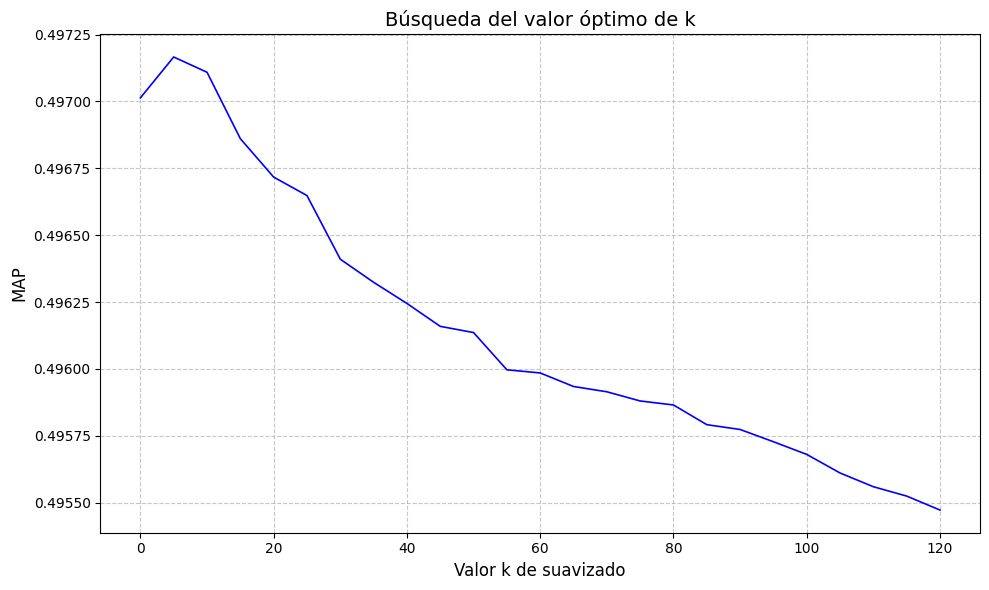

In [ ]:
import matplotlib.pyplot as plt

datos = [[0, 0.49701334750158216],
[5, 0.49716620947295626],
[10, 0.4971091049641763],
[15, 0.4968608799906601],
[20, 0.4967172568485116],
[25, 0.49664821696273154],
[30, 0.49641033069693513],
[35, 0.4963239689943632],
[40, 0.4962449327325624],
[45, 0.49615928854947444],
[50, 0.496136050393252],
[55, 0.49599680233652066],
[60, 0.495985105729283],
[65, 0.4959344780393815],
[70, 0.49591467303296705],
[75, 0.4958803749135134],
[80, 0.49586535894353057],
[85, 0.4957917650207261],
[90, 0.495773751563253],
[95, 0.49572795154696947],
[100, 0.49568051370276744],
[105, 0.49561110313271006],
[110, 0.49555974143920295],
[115, 0.4955247939860256],
[120, 0.49547251239955936]]

x_vals, y_vals = map(list, zip(*datos))

plt.figure(figsize=(10, 6))
plt.plot(x_vals, y_vals, linestyle='-', color='b', linewidth=1.2, markersize=4)

# Mejorar visualización
plt.title('Búsqueda del valor óptimo de k', fontsize=14)
plt.xlabel('Valor k de suavizado', fontsize=12)
plt.ylabel('MAP', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

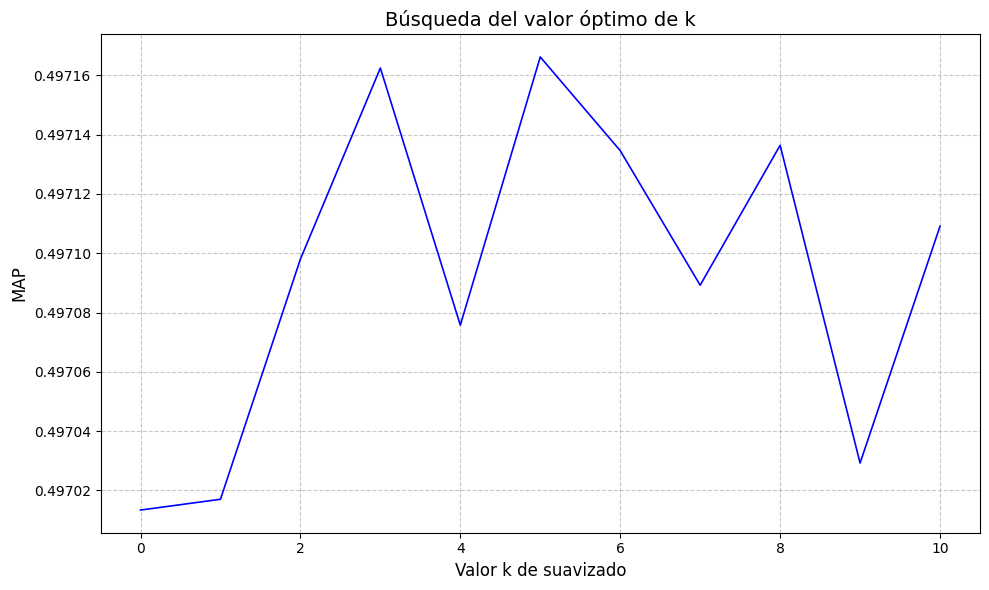

In [ ]:
y_vals = [0.49701334750158216 ,0.497016992836358 ,0.497098008634349 ,0.497162481933049 ,0.4970757199939192 ,0.49716620947295626 ,0.49713460960812816 ,0.49708921038514775 ,0.49713640887293764 ,0.4970292186239058 ,0.4971091049641763]
x_vals = [0,1,2,3,4,5,6,7,8,9,10]

plt.figure(figsize=(10, 6))
plt.plot(x_vals, y_vals, linestyle='-', color='b', linewidth=1.2, markersize=4)

# Mejorar visualización
plt.title('Búsqueda del valor óptimo de k', fontsize=14)
plt.xlabel('Valor k de suavizado', fontsize=12)
plt.ylabel('MAP', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### Opcion final

In [ ]:
combined_run = fuse(
    # norm="min-max",
    runs=runs,
    method="rrf",
    params={"k": 5}
)

fusion_map = evaluate(qrels, combined_run, "map")
print(f"Fusion MAP: {fusion_map}")

Fusion MAP: 0.49716620947295626


## MNZ

In [ ]:
combined_run = fuse(
    norm="min-max",
    runs=runs,
    method="mnz",
)

fusion_map = evaluate(qrels, combined_run, "map")
print(f"Fusion MAP: {fusion_map}")

Fusion MAP: 0.49896024968932706


## WSum

### Experimentacion

In [ ]:
import numpy as np
from ranx import evaluate

values_plot = []

best_map = 0
best_weights = []

# Probamos combinaciones de pesos sencillas
# w1 para el modelo 1, w2 para el 2, w3 para el 3
for w1 in np.arange(0, 1.1, 0.1):
    for w2 in np.arange(0, 1.1, 0.1):
        if w1 + w2 > 1:
            continue
        w3 = max(0, 1.0 - w1 - w2)
        current_weights = [round(w1,1), round(w2,1), round(w3,1)]

        combined_run = fuse(
            runs=runs,
            method="wsum",
            params={"weights": [w1, w2, w3]},
            norm="min-max"
        )

        score = evaluate(qrels, combined_run, "map")

        if score > best_map:
            best_map = score
            best_weights = current_weights

        print(f"Pesos: {current_weights} MAP: {score}")
        values_plot.append([current_weights, score])

print(f"Mejor MAP: {best_map:.4f} usando pesos: {best_weights}")

Pesos: [np.float64(0.0), np.float64(0.0), np.float64(1.0)] MAP: 0.46973670437718534
Pesos: [np.float64(0.0), np.float64(0.1), np.float64(0.9)] MAP: 0.478002201203849
Pesos: [np.float64(0.0), np.float64(0.2), np.float64(0.8)] MAP: 0.48414240222891647
Pesos: [np.float64(0.0), np.float64(0.3), np.float64(0.7)] MAP: 0.4882717188442034
Pesos: [np.float64(0.0), np.float64(0.4), np.float64(0.6)] MAP: 0.4919114935446344
Pesos: [np.float64(0.0), np.float64(0.5), np.float64(0.5)] MAP: 0.4941880840309538
Pesos: [np.float64(0.0), np.float64(0.6), np.float64(0.4)] MAP: 0.4966599899467294
Pesos: [np.float64(0.0), np.float64(0.7), np.float64(0.3)] MAP: 0.4968999443054977
Pesos: [np.float64(0.0), np.float64(0.8), np.float64(0.2)] MAP: 0.49536092953252225
Pesos: [np.float64(0.0), np.float64(0.9), np.float64(0.1)] MAP: 0.49350712886499465
Pesos: [np.float64(0.0), np.float64(1.0), 0] MAP: 0.4907727468080324
Pesos: [np.float64(0.1), np.float64(0.0), np.float64(0.9)] MAP: 0.477537167294569
Pesos: [np.float

In [ ]:
import numpy as np
from ranx import evaluate

values_plot = []

best_map = 0
best_weights = []

# Probamos combinaciones de pesos sencillas
# w1 para el modelo 1, w2 para el 2, w3 para el 3
for w1 in np.arange(0.3, 0.41, 0.01):
    for w2 in np.arange(0.3, 0.41, 0.01):
        if w1 + w2 > 1:
            continue
        w3 = max(0, 1.0 - w1 - w2)
        current_weights = [round(w1,2), round(w2,2), round(w3,2)]

        combined_run = fuse(
            runs=runs,
            method="wsum",
            params={"weights": current_weights},
            norm="min-max"
        )

        score = evaluate(qrels, combined_run, "map")

        if score > best_map:
            best_map = score
            best_weights = current_weights

        print(f"Pesos: {current_weights} MAP: {score}")
        values_plot.append([current_weights, score])

print(f"Mejor MAP: {best_map:.4f} usando pesos: {best_weights}")

Pesos: [np.float64(0.3), np.float64(0.3), np.float64(0.4)] MAP: 0.49830313470476334
Pesos: [np.float64(0.3), np.float64(0.31), np.float64(0.39)] MAP: 0.49841450660533726
Pesos: [np.float64(0.3), np.float64(0.32), np.float64(0.38)] MAP: 0.4986563956198701
Pesos: [np.float64(0.3), np.float64(0.33), np.float64(0.37)] MAP: 0.49869518792294043
Pesos: [np.float64(0.3), np.float64(0.34), np.float64(0.36)] MAP: 0.49883866116821995
Pesos: [np.float64(0.3), np.float64(0.35), np.float64(0.35)] MAP: 0.4989127195900108
Pesos: [np.float64(0.3), np.float64(0.36), np.float64(0.34)] MAP: 0.4990049819289118
Pesos: [np.float64(0.3), np.float64(0.37), np.float64(0.33)] MAP: 0.4991877728996955
Pesos: [np.float64(0.3), np.float64(0.38), np.float64(0.32)] MAP: 0.4991251426772962
Pesos: [np.float64(0.3), np.float64(0.39), np.float64(0.31)] MAP: 0.4992214104145703
Pesos: [np.float64(0.3), np.float64(0.4), np.float64(0.3)] MAP: 0.49937419826174506
Pesos: [np.float64(0.31), np.float64(0.3), np.float64(0.39)] MAP

In [ ]:
import numpy as np
from ranx import evaluate

values_plot = []

best_map = 0
best_weights = []

# Probamos combinaciones de pesos sencillas
# w1 para el modelo 1, w2 para el 2, w3 para el 3
for w1 in np.arange(0.2, 0.31, 0.01):
    for w2 in np.arange(0.2, 0.31, 0.01):
        if w1 + w2 > 1:
            continue
        w3 = max(0, 1.0 - w1 - w2)
        current_weights = [round(w1,2), round(w2,2), round(w3,2)]

        combined_run = fuse(
            runs=runs,
            method="wsum",
            params={"weights": current_weights},
            norm="min-max"
        )

        score = evaluate(qrels, combined_run, "map")

        if score > best_map:
            best_map = score
            best_weights = current_weights

        print(f"Pesos: {current_weights} MAP: {score}")
        values_plot.append([current_weights, score])

print(f"Mejor MAP: {best_map:.4f} usando pesos: {best_weights}")

Pesos: [np.float64(0.2), np.float64(0.2), np.float64(0.6)] MAP: 0.49268611642786253
Pesos: [np.float64(0.2), np.float64(0.21), np.float64(0.59)] MAP: 0.4930941098418036
Pesos: [np.float64(0.2), np.float64(0.22), np.float64(0.58)] MAP: 0.4935193774700586
Pesos: [np.float64(0.2), np.float64(0.23), np.float64(0.57)] MAP: 0.49380304374476486
Pesos: [np.float64(0.2), np.float64(0.24), np.float64(0.56)] MAP: 0.49412147819381397
Pesos: [np.float64(0.2), np.float64(0.25), np.float64(0.55)] MAP: 0.49453676610819286
Pesos: [np.float64(0.2), np.float64(0.26), np.float64(0.54)] MAP: 0.4947797635387153
Pesos: [np.float64(0.2), np.float64(0.27), np.float64(0.53)] MAP: 0.49515395527393447
Pesos: [np.float64(0.2), np.float64(0.28), np.float64(0.52)] MAP: 0.4955735055930335
Pesos: [np.float64(0.2), np.float64(0.29), np.float64(0.51)] MAP: 0.4957721869676881
Pesos: [np.float64(0.2), np.float64(0.3), np.float64(0.5)] MAP: 0.4962345846002623
Pesos: [np.float64(0.21), np.float64(0.2), np.float64(0.59)] MAP

### Final

In [ ]:
weights = [.35, .38, .27]
combined_run = fuse(
    runs=runs,
    method="wsum",
    params={"weights": weights},
    norm="min-max"
)

fusion_map = evaluate(qrels, combined_run, "map")
print(f"Fusion MAP: {fusion_map}")

Fusion MAP: 0.49953778650701297


## Graficas


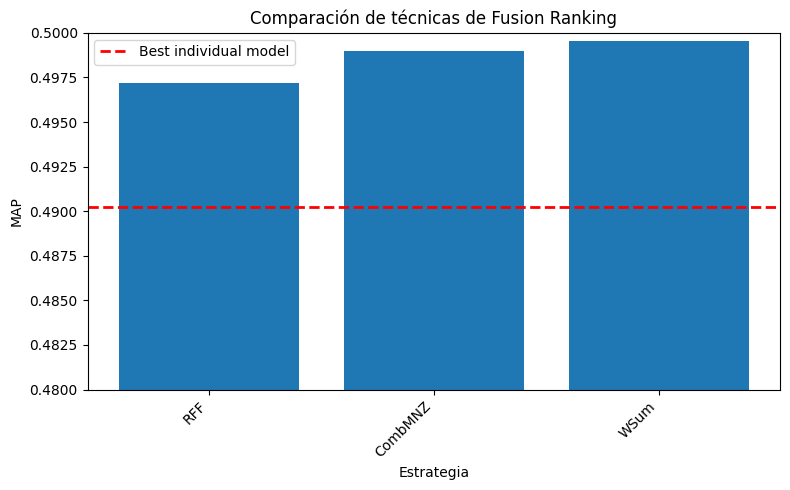

In [ ]:
import matplotlib.pyplot as plt

# Datos
x_val = ['RFF', 'CombMNZ', 'WSum']
y_val = [0.49716620947295626, 0.49896024968932706, 0.49953778650701297]

# Valor del best model (asíntota horizontal)
best_model_value = 0.490223

# Crear la figura
plt.figure(figsize=(8, 5))

# Gráfica de barras
plt.bar(x_val, y_val)

# Escala logarítmica en el eje Y
# plt.yscale('log')
plt.ylim(bottom=0.48, top=0.5)

# Línea horizontal (asíntota) del best model
plt.axhline(
    y=best_model_value,
    linestyle='--',
    linewidth=2,
    label='Best individual model',
    color='red'
)

# Etiquetas y título
plt.xlabel('Estrategia')
plt.ylabel('MAP')
plt.title('Comparación de técnicas de Fusion Ranking')

bar_positions = np.arange(len(x_val))
plt.xticks(bar_positions, x_val, rotation=45, ha='right')
plt.legend()

# Mostrar la gráfica
plt.tight_layout()
plt.show()

## Eleccion final

In [ ]:
weights = [.35, .38, .27]
combined_run = fuse(
    runs=runs,
    method="wsum",
    params={"weights": weights},
    norm="min-max"
)

fusion_map = evaluate(qrels, combined_run, "map")
print(f"Fusion MAP: {fusion_map}")

/usr/local/lib/python3.12/dist-packages/ranx/normalization/min_max_norm.py:44: NumbaTypeSafetyWarning: unsafe cast from uint64 to int64. Precision may be lost.
  normalized_run[i] = _min_max_norm(run[q_ids[i]], invert)


Fusion MAP: 0.4994336057503179


# ReRanking

In [ ]:
import dill

run_dict = dill.load(open("/content/TalentCLEF-TaskA/models/results/run_dict.dill", "rb"))

In [ ]:
def logits_normalization(head, min_value, max_value=1):
  values = [v for _, v in head]

  v_min = min(values)
  v_max = max(values)

  normalized = [
      (key, min_value + (max_value - min_value) * (value - v_min) / (v_max - v_min))
      for key, value in head
  ]

  return normalized


def apply_reranking_top_k(model, k=10, run_file=run_dict, queries_d=queries_dict, corpus_d=corpus_dict):

    reranked_run = {}

    for q_id, docs_scores in run_file.items():
        if q_id not in queries_d:
            continue

        query_text = queries_d[q_id]

        sorted_items = sorted(docs_scores.items(), key=lambda x: x[1], reverse=True)

        head_items = sorted_items[:k]
        tail_items = sorted_items[k:]

        min_similarity = head_items[-1][1]


        if not head_items:
            reranked_run[q_id] = docs_scores
            continue

        pairs_to_predict = []
        valid_head_ids = []

        for doc_id, original_score in head_items:
            if doc_id in corpus_d:
                doc_text = corpus_d[doc_id]
                pairs_to_predict.append([query_text, doc_text])
                valid_head_ids.append(doc_id)
            else:
                pass


        if pairs_to_predict:
            new_scores = model.predict(
                pairs_to_predict,
                # batch_size=1,  # o 64, 128 según tu memoria GPU
                # show_progress_bar=True,
                convert_to_numpy=True
                )

            if len(new_scores.shape) > 1:
                new_scores = new_scores.flatten()

            new_head_items = []
            for i, doc_id in enumerate(valid_head_ids):
                new_head_items.append((doc_id, float(new_scores[i])))

            new_head_items.sort(key=lambda x: x[1], reverse=True)
            new_head_items = logits_normalization(new_head_items, min_similarity)


            final_list = new_head_items + tail_items
            reranked_run[q_id] = dict(final_list)
        else:
            reranked_run[q_id] = dict(sorted_items)

    return reranked_run

## Inferencia

In [ ]:
df_models = pd.read_csv('/content/reranking_models.csv')
df_models.sort_values(by='num_params', ascending=True, inplace=True)

with open('/content/error_list.txt', 'r') as file:
    error_list = [line.strip() for line in file.readlines()]

In [ ]:
error_list

In [ ]:
top_k_list = [10, 25, 50, 100]
base_path = '/content/reranking_models'

# Iteramos sobre los modelos
for index, row in df_models.iterrows():
    model_name = row['model_name']

    # if model_name in error_list:
    #     continue

    if row['map_reranking_100'] != 0:
        continue

    print(f"\n--- Procesando: {model_name} ---")

    # 1. Crear una ruta ÚNICA para este modelo para evitar mezclas
    # Reemplazamos barras en el nombre del modelo para que sea un nombre de carpeta válido
    safe_name = model_name.replace("/", "_")
    model_specific_path = os.path.join(base_path, safe_name)

    # Variable para el modelo, inicializada en None para control de errores
    model = None

    try:
        # # Descarga en su propia carpeta
        # local_path = snapshot_download(
        #     repo_id=model_name,
        #     local_dir=model_specific_path
        # )
        # print(f"Modelo descargado en: {local_path}")

        # Carga optimizada
        model = CrossEncoder(
            model_name, #local_path
            device=DEVICE,
            trust_remote_code=True,
            cache_dir=model_specific_path,
            # automodel_args={"low_cpu_mem_usage": True}
        )

        if model.tokenizer.pad_token is None:
            # Intentar usar eos_token primero
            if model.tokenizer.eos_token is not None:
                model.tokenizer.pad_token = model.tokenizer.eos_token
                model.tokenizer.pad_token_id = model.tokenizer.eos_token_id
            # Si no tiene eos_token, usar el primer token especial disponible
            elif model.tokenizer.unk_token is not None:
                model.tokenizer.pad_token = model.tokenizer.unk_token
                model.tokenizer.pad_token_id = model.tokenizer.unk_token_id
            # Como último recurso, añadir un nuevo token de padding
            else:
                model.tokenizer.add_special_tokens({'pad_token': '[PAD]'})
                model.model.resize_token_embeddings(len(model.tokenizer))

        print(f"✓ Pad token configurado: '{model.tokenizer.pad_token}' (ID: {model.tokenizer.pad_token_id})")


        print(f'Comenzamos la evaluación del reranking para k={top_k_list}')
        # Bucle de evaluación
        for k in top_k_list:
            try:
                temp_reranked = apply_reranking_top_k(model, k, run_dict, queries_dict, corpus_dict)
                temp_map = evaluate(qrels, temp_reranked, "map")
                print(f"  k={k} -> MAP: {temp_map:.4f}")

                # Guardamos en el dataframe usando el índice original
                df_models.at[index, f'map_reranking_{k}'] = temp_map

            except Exception as e:
                print(f"  Error en reranking k={k}: {e}")
                # Si falla un k, decidimos si paramos todo el modelo o seguimos
                error_list.append(model_name)
                break

    except Exception as e:
        print(f"Error CRÍTICO al cargar/descargar {model_name}: {e}")
        error_list.append(model_name)
        continue

    finally:
        # --- LIMPIEZA DE MEMORIA CRÍTICA ---
        # Esto se ejecuta siempre, haya error o no, antes del siguiente modelo
        if model:
            del model

        # Forzar recolección de basura de Python y vaciado de caché de CUDA
        gc.collect()
        torch.cuda.empty_cache()

        # Opcional: Borrar los archivos del disco para no llenar el almacenamiento de Colab
        shutil.rmtree(base_path)
        print("Memoria liberada.")

        # Guardado final
        df_models.to_csv('reranking_models.csv', index=False)

        # Guardar errores
        with open('error_list.txt', 'w') as f:
            for item in error_list:
                f.write(f"{item}\n")


--- Procesando: bmilon/rerank-based-on-BAAI ---


config.json:   0%|          | 0.00/807 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.24G [00:00<?, ?B/s]

Error CRÍTICO al cargar/descargar bmilon/rerank-based-on-BAAI: Unable to load vocabulary from file. Please check that the provided vocabulary is accessible and not corrupted.


Memoria liberada.

--- Procesando: michaelfeil/mxbai-rerank-large-v2-seq ---


config.json:   0%|          | 0.00/846 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/3.09G [00:00<?, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json:   0%|          | 0.00/11.4M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/605 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/613 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

✓ Pad token configurado: '<|endoftext|>' (ID: 151643)
Comenzamos la evaluación del reranking para k=[10, 25, 50, 100]
  Error en reranking k=10: Cannot handle batch sizes > 1 if no padding token is defined.


Memoria liberada.

--- Procesando: tomaarsen/Qwen3-Reranker-4B-seq-cls ---


config.json:   0%|          | 0.00/844 [00:00<?, ?B/s]

model.safetensors.index.json: 0.00B [00:00, ?B/s]

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

model-00001-of-00002.safetensors:   0%|          | 0.00/4.97G [00:00<?, ?B/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/3.08G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json:   0%|          | 0.00/11.4M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/613 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

✓ Pad token configurado: '<|endoftext|>' (ID: 151643)
Comenzamos la evaluación del reranking para k=[10, 25, 50, 100]


/usr/local/lib/python3.12/dist-packages/ranx/utils.py:19: NumbaTypeSafetyWarning: unsafe cast from uint64 to int64. Precision may be lost.
  x[i] = descending_sort(x[i])


  k=10 -> MAP: 0.5109


## Inferencia del top 10

In [ ]:
df_models = pd.read_csv('/content/TalentCLEF-TaskA/models/results/massive evaluation reranking/reranking_models.csv')

error_list = []

In [ ]:
df_top_models = df_models.sort_values(by='map_reranking_10', ascending=False).head(10)
df_top_models = df_top_models[df_top_models['map_reranking_100'] != 0]
df_top_models = df_top_models.drop(columns=['map_reranking_50', 'map_reranking_75', 'map_reranking_100'])

df_top_models

,model_name,num_params,map_reranking_10,map_reranking_25
20,cross-encoder/qnli-distilroberta-base,82119683,0.534084,0.484769
40,Jsevisal/CrossEncoder-ModernBERT-base-qnli,149606402,0.533972,0.481821
25,compnet-renard/bert-base-cased-NER-reranker,108312322,0.532343,0.464817
28,cross-encoder/mmarco-mMiniLMv2-L12-H384-v1,117641603,0.529559,0.514911
41,malaysia-ai/malaysian-llm2vec-reranker-191M-16384,166160640,0.528334,0.475086
58,michaelfeil/mxbai-rerank-base-v2-seq,494034560,0.521993,0.475593
72,AhmedMostafa/bge-reranker-v2-gemma-saudi-achi10,2506176512,0.519805,0.449699
67,noooop9527/Qwen3-Reranker-0.6B-seq-cls-STv6,595777536,0.519043,0.454282
69,tomaarsen/Qwen3-Reranker-0.6B-seq-cls,595777536,0.519043,0.454282
32,sdadas/polish-reranker-base-mse,124443649,0.515049,0.499746


In [ ]:
top_k_list = [5, 15, 20]
base_path = '/content/reranking_models'

# Iteramos sobre los modelos
for index, row in df_top_models.iterrows():
    model_name = row['model_name']

    # if model_name in error_list:
    #     continue

    # if row['map_reranking_100'] != 0:
    #     continue

    print(f"\n--- Procesando: {model_name} ---")

    # 1. Crear una ruta ÚNICA para este modelo para evitar mezclas
    # Reemplazamos barras en el nombre del modelo para que sea un nombre de carpeta válido
    safe_name = model_name.replace("/", "_")
    model_specific_path = os.path.join(base_path, safe_name)

    # Variable para el modelo, inicializada en None para control de errores
    model = None

    try:
        # # Descarga en su propia carpeta
        # local_path = snapshot_download(
        #     repo_id=model_name,
        #     local_dir=model_specific_path
        # )
        # print(f"Modelo descargado en: {local_path}")

        # Carga optimizada
        model = CrossEncoder(
            model_name, #local_path
            device=DEVICE,
            trust_remote_code=True,
            cache_dir=model_specific_path,
            # automodel_args={"low_cpu_mem_usage": True}
        )

        if model.tokenizer.pad_token is None:
            # Intentar usar eos_token primero
            if model.tokenizer.eos_token is not None:
                model.tokenizer.pad_token = model.tokenizer.eos_token
                model.tokenizer.pad_token_id = model.tokenizer.eos_token_id
            # Si no tiene eos_token, usar el primer token especial disponible
            elif model.tokenizer.unk_token is not None:
                model.tokenizer.pad_token = model.tokenizer.unk_token
                model.tokenizer.pad_token_id = model.tokenizer.unk_token_id
            # Como último recurso, añadir un nuevo token de padding
            else:
                model.tokenizer.add_special_tokens({'pad_token': '[PAD]'})
                model.model.resize_token_embeddings(len(model.tokenizer))

        print(f"✓ Pad token configurado: '{model.tokenizer.pad_token}' (ID: {model.tokenizer.pad_token_id})")


        print(f'Comenzamos la evaluación del reranking para k={top_k_list}')
        # Bucle de evaluación
        for k in top_k_list:
            try:
                temp_reranked = apply_reranking_top_k(model, k, run_dict, queries_dict, corpus_dict)
                temp_map = evaluate(qrels, temp_reranked, "map")
                print(f"  k={k} -> MAP: {temp_map:.4f}")

                # Guardamos en el dataframe usando el índice original
                df_top_models.at[index, f'map_reranking_{k}'] = temp_map

            except Exception as e:
                print(f"  Error en reranking k={k}: {e}")
                # Si falla un k, decidimos si paramos todo el modelo o seguimos
                error_list.append(model_name)
                break

    except Exception as e:
        print(f"Error CRÍTICO al cargar/descargar {model_name}: {e}")
        error_list.append(model_name)
        continue

    finally:
        # --- LIMPIEZA DE MEMORIA CRÍTICA ---
        # Esto se ejecuta siempre, haya error o no, antes del siguiente modelo
        if model:
            del model

        # Forzar recolección de basura de Python y vaciado de caché de CUDA
        gc.collect()
        torch.cuda.empty_cache()

        # Opcional: Borrar los archivos del disco para no llenar el almacenamiento de Colab
        shutil.rmtree(base_path)
        print("Memoria liberada.")

        # Guardado final
        df_top_models.to_csv('reranking_models_top10.csv', index=False)

        # Guardar errores
        with open('error_list.txt', 'w') as f:
            for item in error_list:
                f.write(f"{item}\n")


--- Procesando: cross-encoder/qnli-distilroberta-base ---


config.json:   0%|          | 0.00/689 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/328M [00:00<?, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json: 0.00B [00:00, ?B/s]

README.md: 0.00B [00:00, ?B/s]

✓ Pad token configurado: '<pad>' (ID: 1)
Comenzamos la evaluación del reranking para k=[5, 15, 20]
  k=5 -> MAP: 0.5378
  k=15 -> MAP: 0.5179


  k=20 -> MAP: 0.4991
Memoria liberada.

--- Procesando: Jsevisal/CrossEncoder-ModernBERT-base-qnli ---


config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/598M [00:00<?, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/694 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

✓ Pad token configurado: '[PAD]' (ID: 50283)
Comenzamos la evaluación del reranking para k=[5, 15, 20]
  k=5 -> MAP: 0.5419
  k=15 -> MAP: 0.5155


  k=20 -> MAP: 0.4963
Memoria liberada.

--- Procesando: compnet-renard/bert-base-cased-NER-reranker ---


config.json:   0%|          | 0.00/676 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/433M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/60.0 [00:00<?, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

README.md: 0.00B [00:00, ?B/s]

✓ Pad token configurado: '[PAD]' (ID: 0)
Comenzamos la evaluación del reranking para k=[5, 15, 20]
  k=5 -> MAP: 0.5396
  k=15 -> MAP: 0.5053


  k=20 -> MAP: 0.4843
Memoria liberada.

--- Procesando: cross-encoder/mmarco-mMiniLMv2-L12-H384-v1 ---


config.json:   0%|          | 0.00/891 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/471M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/435 [00:00<?, ?B/s]

sentencepiece.bpe.model:   0%|          | 0.00/5.07M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/17.1M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

✓ Pad token configurado: '<pad>' (ID: 1)
Comenzamos la evaluación del reranking para k=[5, 15, 20]
  k=5 -> MAP: 0.5293
  k=15 -> MAP: 0.5215
  k=20 -> MAP: 0.5185


Memoria liberada.

--- Procesando: malaysia-ai/malaysian-llm2vec-reranker-191M-16384 ---


config.json:   0%|          | 0.00/847 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/665M [00:00<?, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/773 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

✓ Pad token configurado: '<pad>' (ID: 0)
Comenzamos la evaluación del reranking para k=[5, 15, 20]
  k=5 -> MAP: 0.5378
  k=15 -> MAP: 0.5095


  k=20 -> MAP: 0.4906
Memoria liberada.

--- Procesando: michaelfeil/mxbai-rerank-base-v2-seq ---


config.json:   0%|          | 0.00/870 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/988M [00:00<?, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json:   0%|          | 0.00/11.4M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/605 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/613 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

✓ Pad token configurado: '<|endoftext|>' (ID: 151643)
Comenzamos la evaluación del reranking para k=[5, 15, 20]
  k=5 -> MAP: 0.5313
  k=15 -> MAP: 0.5053
  k=20 -> MAP: 0.4880


Memoria liberada.

--- Procesando: AhmedMostafa/bge-reranker-v2-gemma-saudi-achi10 ---


config.json:   0%|          | 0.00/744 [00:00<?, ?B/s]

model.safetensors.index.json: 0.00B [00:00, ?B/s]

Fetching 3 files:   0%|          | 0/3 [00:00<?, ?it/s]

model-00002-of-00003.safetensors:   0%|          | 0.00/4.98G [00:00<?, ?B/s]

model-00003-of-00003.safetensors:   0%|          | 0.00/134M [00:00<?, ?B/s]

model-00001-of-00003.safetensors:   0%|          | 0.00/4.91G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

tokenizer.model:   0%|          | 0.00/4.24M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/34.4M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/555 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

✓ Pad token configurado: '<pad>' (ID: 0)
Comenzamos la evaluación del reranking para k=[5, 15, 20]
  k=5 -> MAP: 0.5345
  k=15 -> MAP: 0.4941
  k=20 -> MAP: 0.4688


Memoria liberada.

--- Procesando: noooop9527/Qwen3-Reranker-0.6B-seq-cls-STv6 ---


config.json:   0%|          | 0.00/844 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.38G [00:00<?, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json:   0%|          | 0.00/11.4M [00:00<?, ?B/s]

chat_template.jinja:   0%|          | 0.00/635 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

✓ Pad token configurado: '<|endoftext|>' (ID: 151643)
Comenzamos la evaluación del reranking para k=[5, 15, 20]
  k=5 -> MAP: 0.5226
  k=15 -> MAP: 0.4953
  k=20 -> MAP: 0.4735


Memoria liberada.

--- Procesando: tomaarsen/Qwen3-Reranker-0.6B-seq-cls ---


config.json:   0%|          | 0.00/844 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.38G [00:00<?, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json:   0%|          | 0.00/11.4M [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

✓ Pad token configurado: '<|endoftext|>' (ID: 151643)
Comenzamos la evaluación del reranking para k=[5, 15, 20]
  k=5 -> MAP: 0.5226
  k=15 -> MAP: 0.4953
  k=20 -> MAP: 0.4735


Memoria liberada.

--- Procesando: sdadas/polish-reranker-base-mse ---


config.json:   0%|          | 0.00/796 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/249M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/351 [00:00<?, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/280 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

✓ Pad token configurado: '<pad>' (ID: 1)
Comenzamos la evaluación del reranking para k=[5, 15, 20]
  k=5 -> MAP: 0.5180
  k=15 -> MAP: 0.5091
  k=20 -> MAP: 0.5033
Memoria liberada.


In [ ]:
# Suponiendo que ya tienes el DataFrame df_top_models

# Definir el orden de las columnas
columnas_ordenadas = ['model_name', 'num_params'] + [f'map_reranking_{n}' for n in [5,10,15,20,25]]

# Reordenar las columnas
df_top_models = df_top_models[columnas_ordenadas]
df_top_models

,model_name,num_params,map_reranking_5,map_reranking_10,map_reranking_15,map_reranking_20,map_reranking_25
20,cross-encoder/qnli-distilroberta-base,82119683,0.537850,0.534084,0.517852,0.499150,0.484769
40,Jsevisal/CrossEncoder-ModernBERT-base-qnli,149606402,0.541862,0.533972,0.515450,0.496327,0.481821
25,compnet-renard/bert-base-cased-NER-reranker,108312322,0.539573,0.532343,0.505345,0.484331,0.464817
28,cross-encoder/mmarco-mMiniLMv2-L12-H384-v1,117641603,0.529290,0.529559,0.521539,0.518483,0.514911
41,malaysia-ai/malaysian-llm2vec-reranker-191M-16384,166160640,0.537819,0.528334,0.509493,0.490568,0.475086
58,michaelfeil/mxbai-rerank-base-v2-seq,494034560,0.531293,0.521993,0.505255,0.488043,0.475593
72,AhmedMostafa/bge-reranker-v2-gemma-saudi-achi10,2506176512,0.534460,0.519805,0.494083,0.468784,0.449699
67,noooop9527/Qwen3-Reranker-0.6B-seq-cls-STv6,595777536,0.522598,0.519043,0.495333,0.473498,0.454282
69,tomaarsen/Qwen3-Reranker-0.6B-seq-cls,595777536,0.522598,0.519043,0.495333,0.473498,0.454282
32,sdadas/polish-reranker-base-mse,124443649,0.517989,0.515049,0.509071,0.503298,0.499746


In [ ]:
df_top_models.to_csv('reranking_models_top10.csv', index=False)

## Obtener diccionario final

In [ ]:
model_name = 'Jsevisal/CrossEncoder-ModernBERT-base-qnli'
k=5

In [ ]:
model = CrossEncoder(
    model_name, #local_path
    device=DEVICE,
    trust_remote_code=True,
    cache_dir=model_specific_path,
    # automodel_args={"low_cpu_mem_usage": True}
)
reranking_result = apply_reranking_top_k(model, k, run_dict, queries_dict, corpus_dict)
temp_map = evaluate(qrels, reranking_result, "map")
print(f"  k={k} -> MAP: {temp_map:.4f}")

  k=5 -> MAP: 0.5419


In [ ]:
reranking_result

{'1': {'3250': 1.0,
  '365': 0.9927941372210869,
  '1366': 0.9328809290293355,
  '78': 0.9323514489861175,
  '4554': 0.9258213444100741,
  '3106': 0.9185234385451941,
  '2543': 0.8925013350095582,
  '720': 0.8823296684129626,
  '3644': 0.8803933017903119,
  '3909': 0.81321738851237,
  '4644': 0.8073742672241129,
  '2230': 0.8015691646323554,
  '667': 0.80016596867423,
  '2556': 0.7993285894627615,
  '4058': 0.790702978563497,
  '1181': 0.7828401137371623,
  '476': 0.7824249347926258,
  '3926': 0.7784573943431946,
  '3105': 0.7755524031780481,
  '4142': 0.7731024475362582,
  '358': 0.771900714886401,
  '4077': 0.7242306774884717,
  '2228': 0.7214782427527815,
  '61': 0.7207516980526143,
  '3991': 0.7126496121433672,
  '1189': 0.7122332686428134,
  '1580': 0.7118210436138469,
  '545': 0.7055076478515808,
  '3440': 0.7042807297372349,
  '849': 0.7013636621022127,
  '1229': 0.7012125028277143,
  '1421': 0.7005227620805894,
  '3329': 0.6950937023426518,
  '568': 0.6931940306513076,
  '409':